In [11]:
from grakn.client import *
import pandas as pd
import time
import collections
import numpy as np

# The purpose of this script is to create a report of which elements of a schema have data present.
KEYSPACE = "biograkn_V2prod"
URI = "localhost:1729"

# originally using grakn2prod, holoviews
# scikit-image, 0.18.1 - version required -    
# holoviews                 1.14.3            
# bokeh                     2.3.1    
##grakn 2.01 env graknprodv2_1

def report_values(URI, KEYSPACE, query_in, ret_var, attribute):
    """return a list from a match query, reports on one or more attrubuted for the type listed"""

    t1=time.time()
    lookup = dict(zip(ret_var, attribute))

    with Grakn.core_client(URI) as client:
        with client.session(KEYSPACE, SessionType.DATA) as session:
            #with session.transaction(TransactionType.WRITE) as tx:
            with session.transaction(TransactionType.READ) as tx:
                iterator=tx.query().match(query_in)
                a=(list(iterator))
                #answers = [ans.get('virus-name') for ans in iterator]
                #result = [ answer.value() for answer in answers ]
                live_df = pd.DataFrame()
                
                # this pulles attributes out of the answer object
                for answer in a:
                    row={lookup[i]: [answer.get(i).get_value()] for i in ret_var}
                    live_df = live_df.append(pd.DataFrame(row))
                live_df.reset_index(drop=True, inplace=True)
   
    print(f"elapsed time {time.time()-t1}")            
    return live_df 

## HOW MANY VIRUSES ARE THERE IN THE DB
#there are 15 viruses in the database they appear to be relatives of covid.

def count_values(URI, KEYSPACE, type, limit):
    """ count_values(URI, KEYSPACE, virus, 10) """

    with Grakn.core_client(URI) as client:
        with client.session(KEYSPACE, SessionType.DATA) as session:
            #with session.transaction(TransactionType.WRITE) as tx:
            with session.transaction(TransactionType.READ) as tx:
                query_in=f"match $d isa {type}; limit {limit}; count;"
                ans=tx.query().match_aggregate(query_in)
                print(ans.get().as_int())

def get_edges(src, tgt, nodes=[]):
    """takes two series source and target and makes an edge for each row, 
    node name is translated to unique node index from node series, if no node list is passed then     the source and target take on the strings from the original file
    source and target must be in register and the same length"""
    rowct=len(src)
    edges = pd.DataFrame(np.zeros([rowct,2]), columns=['source', 'target'])
    for i in range(rowct):
        #print (f'{i} rows, adding {tgt[i]} and {src[i]}')
        #idx=pd.Index(nodes).get_loc(tgt[i])
        if len(nodes) == 0:
            edges.iloc[i,1]=tgt.iloc[i,0]
            edges.iloc[i,0]=src.iloc[i,0]
        else: 
            edges.iloc[i,1]=int(pd.Index(nodes).get_loc(tgt.iloc[i,0]))
            edges.iloc[i,0]=int(pd.Index(nodes).get_loc(src.iloc[i,0]))
    return edges

# holoviz graph methods
def split_edges(graph):
    paths = split_dataframe(graph.edgepaths.data[0])
    return graph.clone((graph.data, graph.nodes, paths))

def join_edges(graph):
    return graph.clone((graph.data, graph.nodes, [graph.edgepaths.array()]))

In [12]:
count_values(URI, KEYSPACE, 'virus', 10)

GraknClientException: Client Error: Unable to connect to Grakn server.

In [17]:
# DATA COLLECTION 1

# virus level data - attributes plus discovery-orign and organism
## get all the virus names in the notebook, add thier relatedness attribute0.
# -- funciton: get attribute list from type

attribute= ['virus-name', 'genbank-id', 'identity-percentage', 'organism-name', 'country-name' ] #, 
ret_var=['vn', 'gid','idprc', 'on', 'cn'] #,'gva'

query_in=f"""match $v isa virus, has virus-name $vn, has genbank-id $gid, has identity-percentage $idprc;
$ova(hosting-organism: $o, hosted-virus: $v) isa organism-virus-hosting;
$o isa organism, has organism-name $on;
$discv (discovered-virus: $v, discovering-location: $c) isa discovery;
$c isa country, has country-name $cn;
"""     

#$g isa gene, has gene-symbol $gs, has entrez-id $entid;
#$gva(associated-virus-gene: $g, associated-virus: $v) isa gene-virus-association;

VirAttrib=report_values(URI, KEYSPACE, query_in, ret_var, attribute)
print(VirAttrib.shape)

VirAttrib['organism-name'] = VirAttrib['organism-name'].replace(['Homo sapiens (Human)'],'Human')

### not sure why duplicates are coming back from this query
### also some of the original viruses are not in the data set?
## this is related to the requirement for the gene virus association
## removing that updates teh list

VirAttrib=VirAttrib.drop_duplicates()
print(VirAttrib.shape)
print(VirAttrib)

############### write out the CSVs #############
VirAttrib.to_csv('virus_attributes.csv', index=False)


# round trips
# virus1 > protien1 > virus2. - neighborhood analysis

attribute= ['virus-name1', 'uniprot-name', 'function-description', 'uniprot-entry-name',  'virus-name2', 'genbank-id1', 'genbank-id2'] #, , 'pathway-name', 'pathway-id'
ret_var=['vn1', 'un', 'fdesc', 'unpn', 'vn2', 'gid1', 'gid2'] #,'gva' , 'pwn', 'pwid'

query_in=f"""
match $v1 isa virus, has genbank-id $gid1, has virus-name $vn1; 
$p isa protein, has uniprot-name $un, has function-description $fdesc, has uniprot-entry-name $unpn;
(hosting-virus-protein: $p, associated-virus: $v1) isa protein-virus-association; 
$v2 isa virus, has genbank-id $gid2, has virus-name $vn2;
(hosting-virus-protein: $p, associated-virus: $v2) isa protein-virus-association; 
"""

vir_prot_vir_rt=report_values(URI, KEYSPACE, query_in, ret_var, attribute)
print(vir_prot_vir_rt.shape)

### THIS DOES NOT HAVE duplicates are coming back from this query
### maybe the round trips are reciprical
df=vir_prot_vir_rt.drop_duplicates()
print(df.shape)

# remove self referential paths - this might be a mistake since it will remove proteins that are only linked to one virus - we want all unique paths including terminal paths

def virus_set(x):
    """ this takes in the whole dataframe, pass N columns in next iteration"""
    x['vs_set'] = set([x['genbank-id1'],x['uniprot-entry-name'], x['genbank-id2']])     
    x['vs_set_str'] = str(x['vs_set']) 
    return x

df = df.apply(virus_set, axis=1)
df = df.drop_duplicates('vs_set_str', keep='last')

# # subset by virus 1 and 2 (a or b) 
print(f'dropped reverse paths shape accounting for redundant IDs: {df.shape}')

df.to_csv('vir_prot_vir_rt.csv', index=False)
vir_prot_vir_rt=df
#vir_prot_vir_rt

elapsed time 0.7370660305023193
(36, 5)
(19, 5)
                virus-name genbank-id identity-percentage organism-name  \
0           SARS-CoV[NS-1]   AY508724               79.69         Human   
2                      MHV  AC 000192               50.23         Mouse   
3                      IBV   KY421672               48.38         Avian   
4           SARS-COV[GD01]   AY278489               79.65         Human   
6                     SARS   AY390556                79.7         Human   
8               SARS-CoV-2   AY390556                79.7         Human   
10          SARS-CoV[GZ02]   AY390556                79.7         Human   
12       SARS-CoV[Sino1-11   AY485277                79.7         Human   
14  2019-nCoV[HKU-SZ-002a]   MN938384               99.99         Human   
16  2019-nCoV[HKU-SZ-005b]   MN975262               99.98         Human   
18               2019-nCoV   MN908947                 100         Human   
19               HCoV-229E   MN306046               

In [18]:
## DATA CONCATNEATION

### concatenate and the nodes list with labels.
df1 = pd.DataFrame(pd.Series(vir_prot_vir_rt['virus-name1']))
df1.rename(columns={df1.columns[0]:'entity_name'}, inplace=True)

df2 = pd.DataFrame(pd.Series(vir_prot_vir_rt['uniprot-entry-name']))
df2.rename(columns={df2.columns[0]:'entity_name'}, inplace=True)

df3 = pd.DataFrame(pd.Series(vir_prot_vir_rt['virus-name2']))
df3.rename(columns={df3.columns[0]:'entity_name'}, inplace=True)

frames = [df1, df2, df3]
nodes_all=pd.Series(np.unique(pd.concat(frames)))

# with index number labels
edges_1= get_edges(src=df1, tgt=df2, nodes=nodes_all)
edges_2= get_edges(src=df2, tgt=df3, nodes=nodes_all)
edges_all=pd.concat([edges_1,edges_2])

## with string labels
edges_all_label=pd.concat([get_edges(src=df1, tgt=df2),get_edges(src=df2, tgt=df3)])

## add lables ###
df1['cat'] = 'virus'
df2['cat'] = 'protein'
df3['cat']= 'virus'
frames = [df1, df2, df3]

nodes_all_labels=pd.concat(frames).drop_duplicates()
nodes_all_labels.reset_index(inplace=True, drop=True)


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
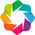

In [14]:
# image rendering 

import holoviews as hv
import dask.dataframe as dd
from holoviews.operation.datashader import (
    datashade, aggregate, dynspread,
    bundle_graph, split_dataframe,  regrid#, stack
)
from holoviews.element.graphs import layout_nodes
from datashader.layout import forceatlas2_layout, random_layout

hv.extension('bokeh')

%opts Graph Nodes [bgcolor='black' width=800 height=800 xaxis=None yaxis=None]



In [2]:
#graph.edgepaths.data[0]

In [43]:
%%opts Nodes (size=5)
graph = layout_nodes(hv.Graph(edges_all), layout=forceatlas2_layout)
forceatlas = bundle_graph(graph, split=False)

pad = dict(x=(-.5, 1.3), y=(-.5, 1.3))
fig = datashade(forceatlas, width=800, height=800) * forceatlas.nodes.redim.range(**pad)

# we can save a html version
fig

:DynamicMap   []
   :Overlay
      .RGB.I   :RGB   [x,y]   (R,G,B,A)
      .Nodes.I :Nodes   [x,y,index]

In [28]:
# save the output to an html
hv.save(fig, 'out2.html')

0        0.0
1        1.0
2        2.0
3        3.0
4        4.0
       ...  
119    119.0
120    120.0
121    121.0
122    122.0
123    123.0
Name: index, Length: 124, dtype: float64

In [31]:
#print(split_atlas.__dict__)
#print(split_atlas._edgepaths.data)
#print(split_atlas._nodes.data)
print(len(forceatlas._nodes.data))
print(graph.edgepaths.data[0])

124
[[0.63437921 0.71065062]
 [0.6055724  0.54521948]]


In [101]:
# annotate the indexes with the protein or virus (node names)

forceatlas2=forceatlas
#forceatlas2._nodes.data.iloc[0,2] = 'test'
forceatlas2._nodes.data.set_index(np.zeros(len(forceatlas._nodes.data)),inplace=True)
forceatlas2._nodes.data.set_index(nodes_all,inplace=True) 
#print(forceatlas2._nodes.data)
forceatlas2._nodes.data.to_csv('node_index.csv')


# make a lookup dictionary of node number and name
nodename_dict = {i.index:i.Index for i in forceatlas2._nodes.data.itertuples()}

# -- map the text values to the source list, so we can render them __ DOES NOT WORK. datashader needs numbers to render
#forceatlas2.data['source']=forceatlas2.data['source'].map(nodename_dict)


                    x         y  index
AB17A_HUMAN  0.430314  0.838505    0.0
ACBD5_HUMAN  0.548343  0.041554    1.0
ACE2_HUMAN   0.440654  0.314703    2.0
ACON_HUMAN   0.762863  0.113024    3.0
AMPN_HUMAN   0.786989  0.002479    4.0
...               ...       ...    ...
UBC9_HUMAN   0.161119  0.375126  119.0
VKOR1_HUMAN  0.157973  0.483209  120.0
XPO1_HUMAN   0.146714  0.552474  121.0
YKT6_HUMAN   0.845760  0.122028  122.0
ZCRB1_HUMAN  0.653537  0.654587  123.0

[124 rows x 3 columns]


In [82]:
#forceatlas2.data

row = 0
col='source'
node_number = forceatlas2.data.source.iloc[row]
# get the name from the node number - and write it on to the source sink 
forceatlas2._nodes.data.index[forceatlas2._nodes.data['index']==node_number]._data[0]


#def translate_labels(forceatlas2):



49.0

In [115]:
##forceatlas2
#########plot matplolib on top ############
# import matplotlib.pyplot as plt
# import matplotlib.transforms as mtransforms
# import numpy as np
# %matplotlib inline   
# # the above line allows the plot to appear in the notebook

# xs = np.arange(7)
# ys = xs**2

# fig = plt.figure(figsize=(5, 10))
# ax = plt.subplot(2, 1, 1)

# # If we want the same offset for each text instance,
# # we only need to make one transform.  To get the
# # transform argument to offset_copy, we need to make the axes
# # first; the subplot command above is one way to do this.
# trans_offset = mtransforms.offset_copy(ax.transData, fig=fig,
#                                        x=0.05, y=0.10, units='inches')

# for x, y in zip(xs, ys):
#     plt.plot((x,), (y,), 'ro')
#     plt.text(x, y, '%d, %d' % (int(x), int(y)), transform=trans_offset)

#print(nodes_all)

In [102]:
%%opts Graph (edge_alpha=0 edge_hover_alpha=1 edge_nonselection_alpha=0 node_size=8 node_alpha=0.5) [inspection_policy='edges']

split_atlas = split_edges(forceatlas)
udp_style = dict(edge_hover_line_color='red', node_fill_color='red', edge_selection_line_color='red')
tcp_style = dict(edge_hover_line_color='blue', node_fill_color='blue', edge_selection_line_color='blue')
udp = split_atlas.select(protocol='udp', weight=(1000, None)).opts(style=udp_style)
tcp = split_atlas.select(protocol='tcp', weight=(1000, None)).opts(style=tcp_style)
fig = datashade(forceatlas2, width=800, height=800, normalization='log', cmap=['grey', 'white']) * tcp * udp  

#points = hv.Points(df, ['x','y'])
#labels = hv.Labels(df, ['x','y'], 'label')

#datashade(points) * decimate(labels)

fig

ValueError: invalid literal for int() with base 10: 'IBV'

In [33]:
# save the output to an html
hv.save(fig, 'out3.html')

In [18]:
split_atlas.__dict__.keys()

dict_keys(['_nodes', '_edgepaths', '_in_method', 'interface', 'data', '_id', '_plot_id', 'initialized', '_parameters_state', '_instance__params', '_param_watchers', '_name_param_value', '_group_param_value', '_label_param_value', '_cdims_param_value', '_kdims_param_value', '_vdims_param_value', '_datatype_param_value', '_extents_param_value', 'ndims', '_cached_constants', '_settings', '_pipeline', '_transforms', '_cached', '_dataset'])

In [19]:
udp

:Graph   [source,target]

In [117]:
tcp

:Graph   [source,target]

In [20]:
%%opts Nodes (size=10)
circular = bundle_graph(hv.Graph(edges_all), split=False)
pad = dict(x=(-1.2, 1.2), y=(-1.2, 1.2))
datashade(circular, width=800, height=800) * circular.nodes.redim.range(**pad)
#127 node indexes. 

:DynamicMap   []
   :Overlay
      .RGB.I   :RGB   [x,y]   (R,G,B,A)
      .Nodes.I :Nodes   [x,y,index]

In [21]:
%%opts Graph (edge_line_color='white' edge_hover_line_color='blue')
split_circular = split_edges(circular)
datashade(circular, width=800, height=800) * split_circular.select(weight=(10000, None)).redim.range(**pad)



:DynamicMap   []
   :Overlay
      .RGB.I   :RGB   [x,y]   (R,G,B,A)
      .Graph.I :Graph   [source,target]

In [7]:
selected_perspective = 'All'
selected_method = 'None'

selected_perspective  =='All' and selected_method  =='All'


False